In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [5]:
calc_test_df = pd.read_csv('../data/raw/calc_case_description_test_set.csv')
calc_test_df.head()

,patient_id,breast density,left or right breast,image view,abnormality id,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path
0,P_00038,2,LEFT,CC,1,calcification,PUNCTATE-PLEOMORPHIC,CLUSTERED,4,BENIGN,2,Calc-Test_P_00038_LEFT_CC/1.3.6.1.4.1.9590.100...,Calc-Test_P_00038_LEFT_CC_1/1.3.6.1.4.1.9590.1...,Calc-Test_P_00038_LEFT_CC_1/1.3.6.1.4.1.9590.1...
1,P_00038,2,LEFT,MLO,1,calcification,PUNCTATE-PLEOMORPHIC,CLUSTERED,4,BENIGN,2,Calc-Test_P_00038_LEFT_MLO/1.3.6.1.4.1.9590.10...,Calc-Test_P_00038_LEFT_MLO_1/1.3.6.1.4.1.9590....,Calc-Test_P_00038_LEFT_MLO_1/1.3.6.1.4.1.9590....
2,P_00038,2,RIGHT,CC,1,calcification,VASCULAR,NaN,2,BENIGN_WITHOUT_CALLBACK,5,Calc-Test_P_00038_RIGHT_CC/1.3.6.1.4.1.9590.10...,Calc-Test_P_00038_RIGHT_CC_1/1.3.6.1.4.1.9590....,Calc-Test_P_00038_RIGHT_CC_1/1.3.6.1.4.1.9590....
3,P_00038,2,RIGHT,CC,2,calcification,VASCULAR,NaN,2,BENIGN_WITHOUT_CALLBACK,5,Calc-Test_P_00038_RIGHT_CC/1.3.6.1.4.1.9590.10...,Calc-Test_P_00038_RIGHT_CC_2/1.3.6.1.4.1.9590....,Calc-Test_P_00038_RIGHT_CC_2/1.3.6.1.4.1.9590....
4,P_00038,2,RIGHT,MLO,1,calcification,VASCULAR,NaN,2,BENIGN_WITHOUT_CALLBACK,5,Calc-Test_P_00038_RIGHT_MLO/1.3.6.1.4.1.9590.1...,Calc-Test_P_00038_RIGHT_MLO_1/1.3.6.1.4.1.9590...,Calc-Test_P_00038_RIGHT_MLO_1/1.3.6.1.4.1.9590...


In [6]:
metadata_df = pd.read_csv('../data/raw/metadata.csv')
metadata_df.head()

,Series UID,Collection,3rd Party Analysis,Data Description URI,Subject ID,Study UID,Study Description,Study Date,Series Description,Manufacturer,Modality,SOP Class Name,SOP Class UID,Number of Images,File Size,File Location,Download Timestamp
0,1.3.6.1.4.1.9590.100.1.2.419081637812053404913...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_LEFT_CC_1,1.3.6.1.4.1.9590.100.1.2.161465562211359959230...,NaN,08-29-2017,ROI mask images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,2,14.06 MB,./CBIS-DDSM/Calc-Test_P_00038_LEFT_CC_1/08-29-...,2024-08-23T18:59:31.511
1,1.3.6.1.4.1.9590.100.1.2.374115997511889073021...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_LEFT_CC,1.3.6.1.4.1.9590.100.1.2.859354343102033567126...,NaN,08-29-2017,full mammogram images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,1,27.84 MB,./CBIS-DDSM/Calc-Test_P_00038_LEFT_CC/08-29-20...,2024-08-23T18:59:32.314
2,1.3.6.1.4.1.9590.100.1.2.174390361112646747718...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_LEFT_MLO,1.3.6.1.4.1.9590.100.1.2.384159464510350889125...,NaN,08-29-2017,full mammogram images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,1,28.97 MB,./CBIS-DDSM/Calc-Test_P_00038_LEFT_MLO/08-29-2...,2024-08-23T18:59:33.076
3,1.3.6.1.4.1.9590.100.1.2.188613955710170417803...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_LEFT_MLO_1,1.3.6.1.4.1.9590.100.1.2.291121996131431385353...,NaN,08-29-2017,ROI mask images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,2,14.62 MB,./CBIS-DDSM/Calc-Test_P_00038_LEFT_MLO_1/08-29...,2024-08-23T18:59:33.91
4,1.3.6.1.4.1.9590.100.1.2.263861248711313923336...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_RIGHT_CC,1.3.6.1.4.1.9590.100.1.2.177706148911820252341...,NaN,08-29-2017,full mammogram images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,1,25.73 MB,./CBIS-DDSM/Calc-Test_P_00038_RIGHT_CC/08-29-2...,2024-08-23T18:59:34.183


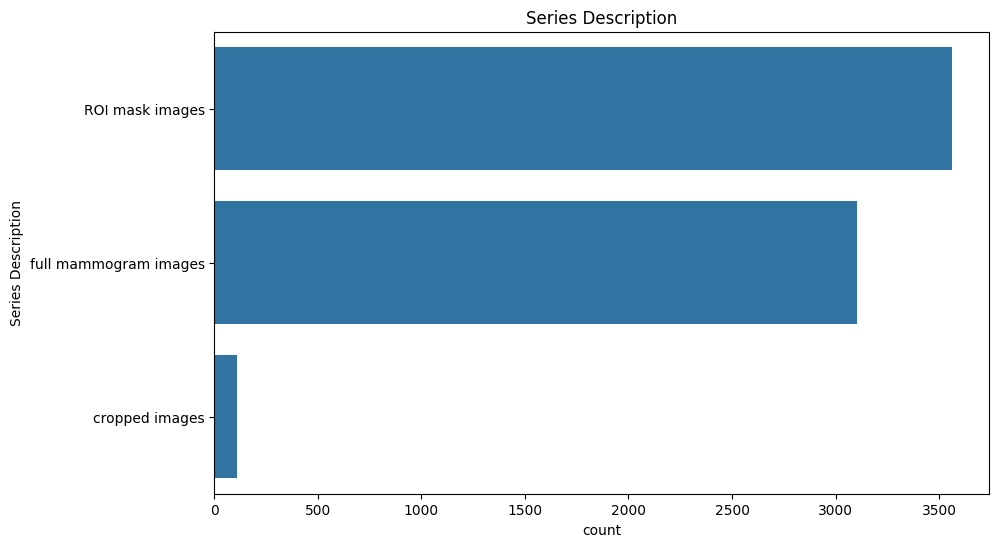

In [7]:
#plot series description
plt.figure(figsize=(10,6))
sns.countplot(y=metadata_df['Series Description'], order = metadata_df['Series Description'].value_counts().index)
plt.title('Series Description')
plt.show()

In [8]:
#drop full mammogram images
metadata_df = metadata_df[metadata_df['Series Description'] != 'full mammogram images']

In [9]:
metadata_df['File Location'] = metadata_df['File Location'].apply(lambda x: '../data/raw/' + x.replace('./',''))
metadata_df['File Location'].head()

0    ../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_C...
3    ../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_M...
5    ../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...
6    ../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...
7    ../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...
Name: File Location, dtype: object

In [10]:
metadata_df.head()

,Series UID,Collection,3rd Party Analysis,Data Description URI,Subject ID,Study UID,Study Description,Study Date,Series Description,Manufacturer,Modality,SOP Class Name,SOP Class UID,Number of Images,File Size,File Location,Download Timestamp
0,1.3.6.1.4.1.9590.100.1.2.419081637812053404913...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_LEFT_CC_1,1.3.6.1.4.1.9590.100.1.2.161465562211359959230...,NaN,08-29-2017,ROI mask images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,2,14.06 MB,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_C...,2024-08-23T18:59:31.511
3,1.3.6.1.4.1.9590.100.1.2.188613955710170417803...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_LEFT_MLO_1,1.3.6.1.4.1.9590.100.1.2.291121996131431385353...,NaN,08-29-2017,ROI mask images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,2,14.62 MB,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_M...,2024-08-23T18:59:33.91
5,1.3.6.1.4.1.9590.100.1.2.244876997513875090239...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_RIGHT_CC_1,1.3.6.1.4.1.9590.100.1.2.200764632211227648028...,NaN,08-29-2017,ROI mask images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,2,13.41 MB,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,2024-08-23T18:59:34.532
6,1.3.6.1.4.1.9590.100.1.2.360550081712464813321...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_RIGHT_CC_2,1.3.6.1.4.1.9590.100.1.2.248538452013626298441...,NaN,08-29-2017,ROI mask images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,2,13.24 MB,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,2024-08-23T18:59:35.537
7,1.3.6.1.4.1.9590.100.1.2.126295284812046209819...,CBIS-DDSM,NaN,https://doi.org/10.7937/K9/TCIA.2016.7O02S9CY,Calc-Test_P_00038_RIGHT_MLO_1,1.3.6.1.4.1.9590.100.1.2.348569460311013218440...,NaN,08-29-2017,ROI mask images,NaN,MG,Secondary Capture Image Storage,1.2.840.10008.5.1.4.1.1.7,2,15.17 MB,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,2024-08-23T18:59:35.701


In [11]:
calc_test_df.head()

,patient_id,breast density,left or right breast,image view,abnormality id,abnormality type,calc type,calc distribution,assessment,pathology,subtlety,image file path,cropped image file path,ROI mask file path
0,P_00038,2,LEFT,CC,1,calcification,PUNCTATE-PLEOMORPHIC,CLUSTERED,4,BENIGN,2,Calc-Test_P_00038_LEFT_CC/1.3.6.1.4.1.9590.100...,Calc-Test_P_00038_LEFT_CC_1/1.3.6.1.4.1.9590.1...,Calc-Test_P_00038_LEFT_CC_1/1.3.6.1.4.1.9590.1...
1,P_00038,2,LEFT,MLO,1,calcification,PUNCTATE-PLEOMORPHIC,CLUSTERED,4,BENIGN,2,Calc-Test_P_00038_LEFT_MLO/1.3.6.1.4.1.9590.10...,Calc-Test_P_00038_LEFT_MLO_1/1.3.6.1.4.1.9590....,Calc-Test_P_00038_LEFT_MLO_1/1.3.6.1.4.1.9590....
2,P_00038,2,RIGHT,CC,1,calcification,VASCULAR,NaN,2,BENIGN_WITHOUT_CALLBACK,5,Calc-Test_P_00038_RIGHT_CC/1.3.6.1.4.1.9590.10...,Calc-Test_P_00038_RIGHT_CC_1/1.3.6.1.4.1.9590....,Calc-Test_P_00038_RIGHT_CC_1/1.3.6.1.4.1.9590....
3,P_00038,2,RIGHT,CC,2,calcification,VASCULAR,NaN,2,BENIGN_WITHOUT_CALLBACK,5,Calc-Test_P_00038_RIGHT_CC/1.3.6.1.4.1.9590.10...,Calc-Test_P_00038_RIGHT_CC_2/1.3.6.1.4.1.9590....,Calc-Test_P_00038_RIGHT_CC_2/1.3.6.1.4.1.9590....
4,P_00038,2,RIGHT,MLO,1,calcification,VASCULAR,NaN,2,BENIGN_WITHOUT_CALLBACK,5,Calc-Test_P_00038_RIGHT_MLO/1.3.6.1.4.1.9590.1...,Calc-Test_P_00038_RIGHT_MLO_1/1.3.6.1.4.1.9590...,Calc-Test_P_00038_RIGHT_MLO_1/1.3.6.1.4.1.9590...


In [12]:
calc_test_df['subject_id'] = calc_test_df['cropped image file path'].apply(lambda x: x.split('/')[0])
#drop everything except the subject_id and pathology
calc_test_df = calc_test_df[['subject_id', 'pathology']]
calc_test_df.head()

,subject_id,pathology
0,Calc-Test_P_00038_LEFT_CC_1,BENIGN
1,Calc-Test_P_00038_LEFT_MLO_1,BENIGN
2,Calc-Test_P_00038_RIGHT_CC_1,BENIGN_WITHOUT_CALLBACK
3,Calc-Test_P_00038_RIGHT_CC_2,BENIGN_WITHOUT_CALLBACK
4,Calc-Test_P_00038_RIGHT_MLO_1,BENIGN_WITHOUT_CALLBACK


In [13]:
metadata_temp = metadata_df.copy()
#drop everything except the subject_id and File Location
metadata_temp = metadata_temp[['Subject ID', 'File Location']]
metadata_temp['subject_id'] = metadata_temp['Subject ID']
metadata_temp.head()

,Subject ID,File Location,subject_id
0,Calc-Test_P_00038_LEFT_CC_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_C...,Calc-Test_P_00038_LEFT_CC_1
3,Calc-Test_P_00038_LEFT_MLO_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_M...,Calc-Test_P_00038_LEFT_MLO_1
5,Calc-Test_P_00038_RIGHT_CC_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,Calc-Test_P_00038_RIGHT_CC_1
6,Calc-Test_P_00038_RIGHT_CC_2,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,Calc-Test_P_00038_RIGHT_CC_2
7,Calc-Test_P_00038_RIGHT_MLO_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,Calc-Test_P_00038_RIGHT_MLO_1


In [14]:
#merge the two dataframes on subject_id
merged_df = pd.merge(calc_test_df, metadata_temp, on='subject_id')
merged_df.head()


,subject_id,pathology,Subject ID,File Location
0,Calc-Test_P_00038_LEFT_CC_1,BENIGN,Calc-Test_P_00038_LEFT_CC_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_C...
1,Calc-Test_P_00038_LEFT_MLO_1,BENIGN,Calc-Test_P_00038_LEFT_MLO_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_M...
2,Calc-Test_P_00038_RIGHT_CC_1,BENIGN_WITHOUT_CALLBACK,Calc-Test_P_00038_RIGHT_CC_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...
3,Calc-Test_P_00038_RIGHT_CC_2,BENIGN_WITHOUT_CALLBACK,Calc-Test_P_00038_RIGHT_CC_2,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...
4,Calc-Test_P_00038_RIGHT_MLO_1,BENIGN_WITHOUT_CALLBACK,Calc-Test_P_00038_RIGHT_MLO_1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...


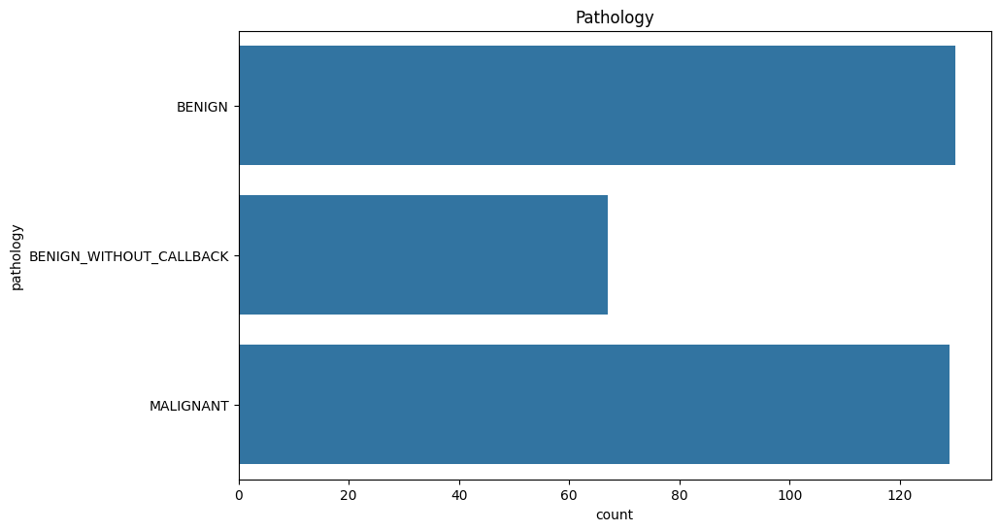

In [15]:
#histogram of pathology
plt.figure(figsize=(10,6))
sns.countplot(merged_df['pathology'])
plt.title('Pathology') 
plt.show()

In [16]:
filename = metadata_df['File Location'].iloc[0]

# search all file in the folder
import os
import pydicom

def get_dicom_files(folder):
    dicom_files = []
    for dirpath, dirnames, filenames in os.walk(folder):
        for filename in filenames:
            if filename.endswith('.dcm'):
                dicom_files.append(os.path.join(dirpath, filename))
    return dicom_files

dicom_files = get_dicom_files(filename)
print(dicom_files)


['../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_CC_1/08-29-2017-DDSM-NA-94942/1.000000-ROI mask images-18515/1-2.dcm', '../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_CC_1/08-29-2017-DDSM-NA-94942/1.000000-ROI mask images-18515/1-1.dcm']


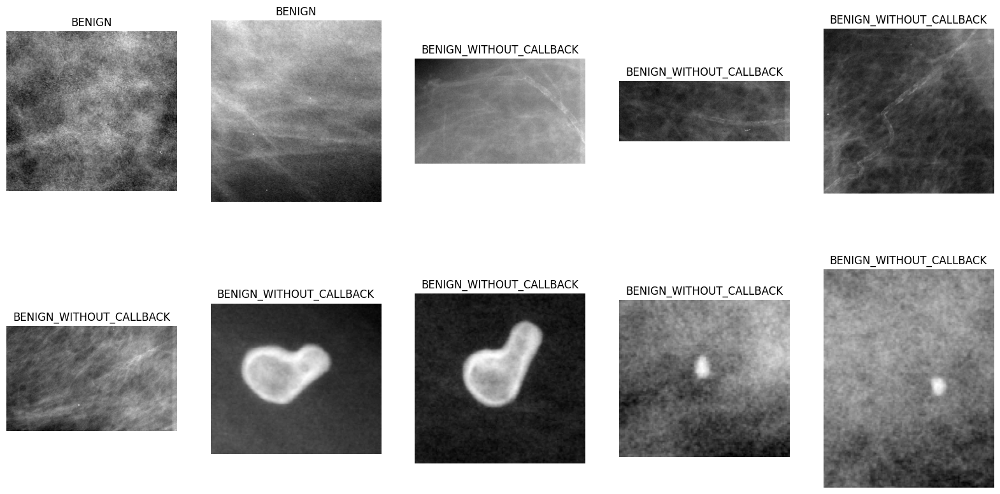

In [17]:
# plot image from metadata. open .dcm file and add patholgy label
import pydicom
from pydicom.data import get_testdata_files
from pydicom.filereader import dcmread
import cv2 as cv

files, lavels = merged_df['File Location'], merged_df['pathology']
files, lavels = files[:10], lavels[:10]
fig, axes = plt.subplots(2, 5, figsize=(20, 10))
axes = axes.ravel()
for i, (file, label) in enumerate(zip(files, lavels)):
    dicom_files = get_dicom_files(file)
    ds = dcmread(dicom_files[1])
    img = ds.pixel_array
    axes[i].imshow(img, cmap='gray')
    axes[i].set_title(label)
    axes[i].axis('off')        
plt.show()





In [27]:
get_dicom_files(files[0])[0]

'../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_CC_1/08-29-2017-DDSM-NA-94942/1.000000-ROI mask images-18515/1-2.dcm'

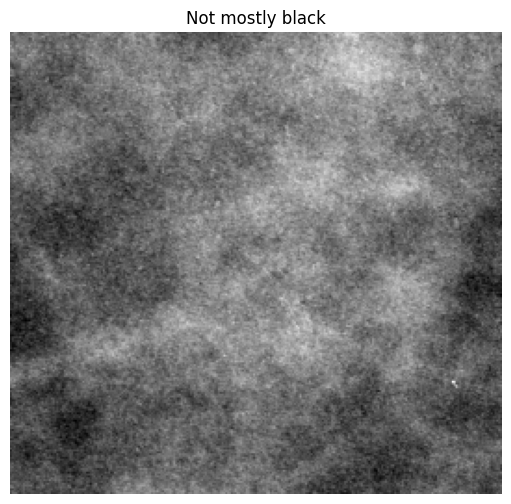

In [29]:
def preprocess_image(img):
    # Check the minimum and maximum values of the image
    min_val, max_val = np.min(img), np.max(img)
    
    # Normalize image if the range is not 0-255
    if max_val > 255 or img.dtype != np.uint8:
        img = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
    
    return img

def is_mostly_black(img, black_threshold=0.6, white_threshold=0.5, midtone_threshold=0.1):
    # Preprocess the image to ensure it's in the right format
    gray = preprocess_image(img)
    
    # Calculate histogram
    hist = cv.calcHist([gray], [0], None, [256], [0, 256])
    hist = hist / hist.sum()  # Normalize histogram to get proportions
    
    # Analyze histogram
    black_proportion = hist[0]  # Proportion of black pixels
    white_proportion = hist[-1]  # Proportion of white pixels
    
    # Proportion of midtone pixels (e.g., pixel values from 50 to 200)
    midtone_proportion = np.sum(hist[50:200])

    
    # Adjusted classification logic based on histogram spread
    if midtone_proportion < midtone_threshold:
        return True
    else:
        return False


test_img = dcmread(get_dicom_files(files[0])[1]).pixel_array
fig = plt.figure(figsize=(10, 6))
plt.imshow(test_img, cmap='gray')
plt.title('Mostly black' if is_mostly_black(test_img) else 'Not mostly black')
plt.axis('off')
plt.show()


In [30]:
import pandas as pd
from tqdm import tqdm

black_images = []
non_black_images = []
files, pathologys = merged_df['File Location'], merged_df['pathology']

for file, pathology in tqdm(zip(files, pathologys), desc="Processing files", total=len(files)):
    dicom_files = get_dicom_files(file)
    for d in dicom_files:
        img = dcmread(d).pixel_array
        image_info = {
            'dicom_file': d,
            'pathology': pathology
        }
        if is_mostly_black(img):
            black_images.append(image_info)
        else:
            non_black_images.append(image_info)

# Convert lists to DataFrames for better indexing and querying
black_images_df = pd.DataFrame(black_images)
non_black_images_df = pd.DataFrame(non_black_images)

print(f'{len(black_images_df)} images are mostly black')

# Accessing the first black image's file and pathology using DataFrame indexing
if not black_images_df.empty:
    first_black_image = black_images_df.iloc[0]
    print(f'First black image file: {first_black_image["dicom_file"]}')
    print(f'Pathology associated with first black image: {first_black_image["pathology"]}')
else:
    print('No black images found.')

Processing files:   0%|          | 0/326 [00:00<?, ?it/s]

Processing files: 100%|██████████| 326/326 [00:32<00:00,  9.96it/s]

329 images are mostly black
First black image file: ../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_CC_1/08-29-2017-DDSM-NA-94942/1.000000-ROI mask images-18515/1-2.dcm
Pathology associated with first black image: BENIGN


In [31]:
black_images_df.head()

,dicom_file,pathology
0,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_C...,BENIGN
1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_M...,BENIGN
2,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK
3,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK
4,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK


In [32]:
all_images = pd.concat([black_images_df, non_black_images_df], ignore_index=True)

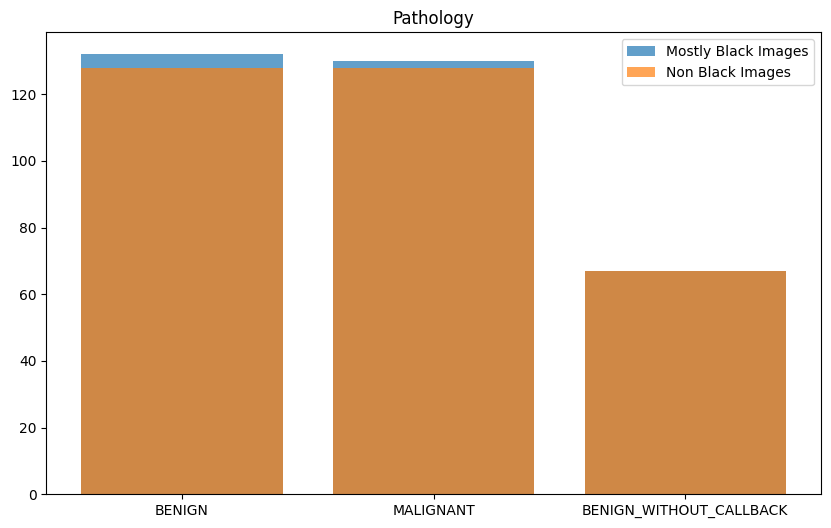

In [33]:
#plot histogram of black images count and non black images count
plt.figure(figsize=(10,6))
b_count = black_images_df['pathology'].value_counts()
nb_count = non_black_images_df['pathology'].value_counts()
plt.bar(b_count.index, b_count.values, alpha=0.7, label='Mostly Black Images')
plt.bar(nb_count.index, nb_count.values, alpha=0.7, label='Non Black Images')
plt.title('Pathology')
plt.legend()


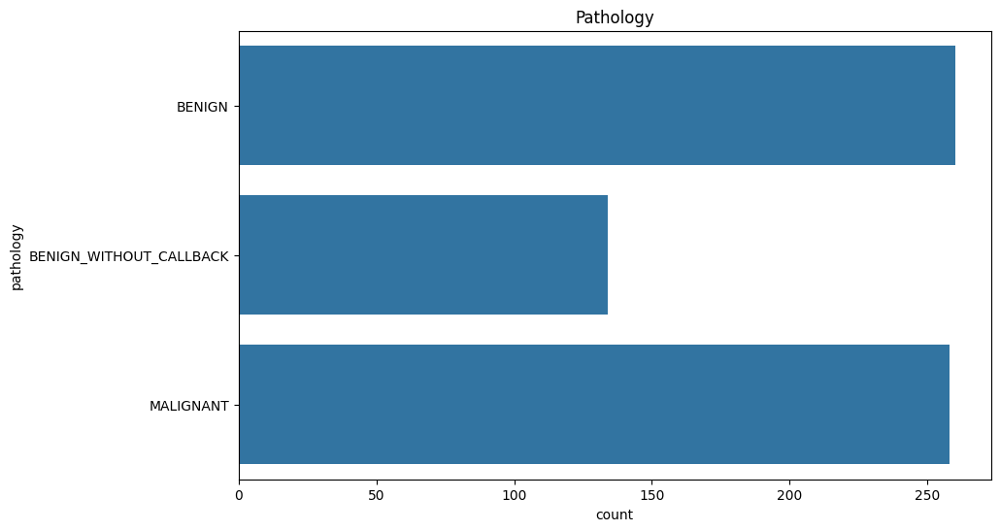

In [34]:
#plot histogram of mostly black images and non black images

plt.figure(figsize=(10,6))

sns.countplot(all_images['pathology'])
plt.title('Pathology')
plt.show()


In [35]:
#save the black images names and non black images names and corresponding labels

black_images_df.to_csv('../data/processed/black_images.csv', index=False)
non_black_images_df.to_csv('../data/processed/non_black_images.csv', index=False)

In [36]:
black_images_df.head()

,dicom_file,pathology
0,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_C...,BENIGN
1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_M...,BENIGN
2,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK
3,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK
4,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK


Displaying batch 1/4


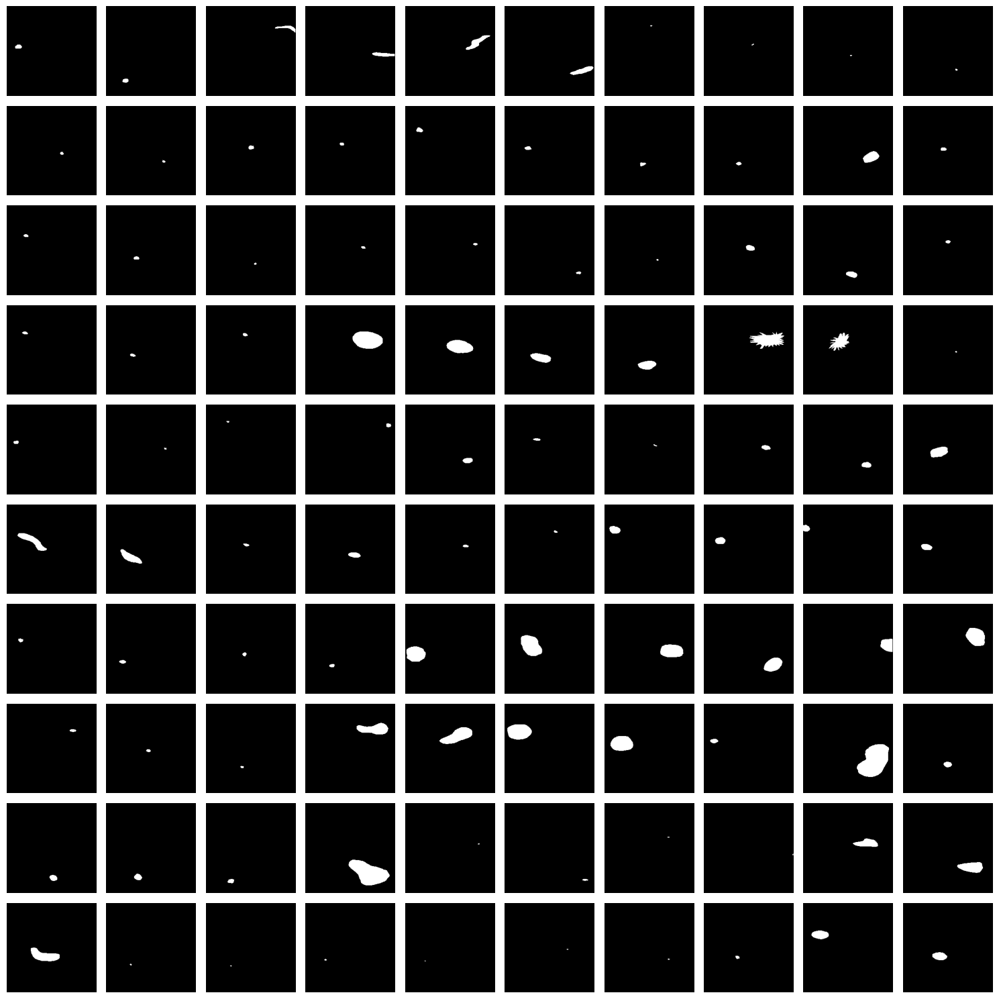

Displaying batch 2/4


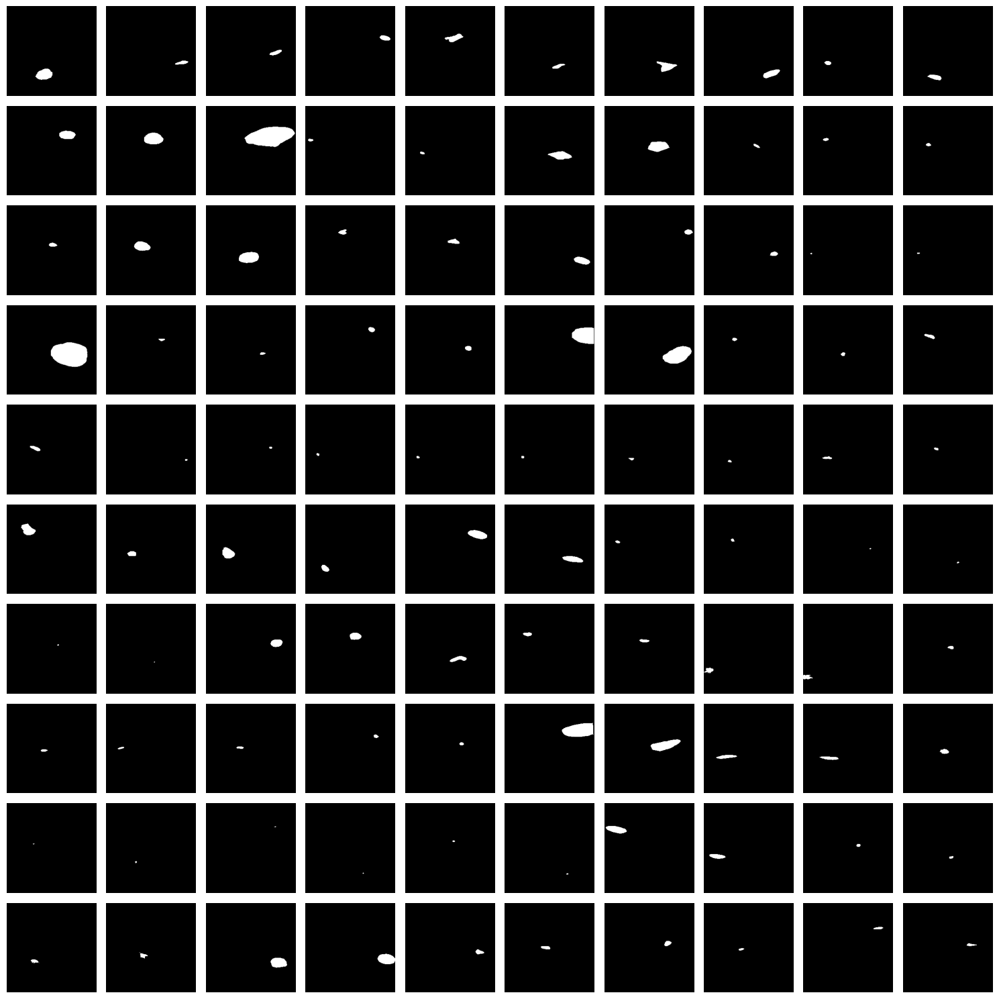

Displaying batch 3/4


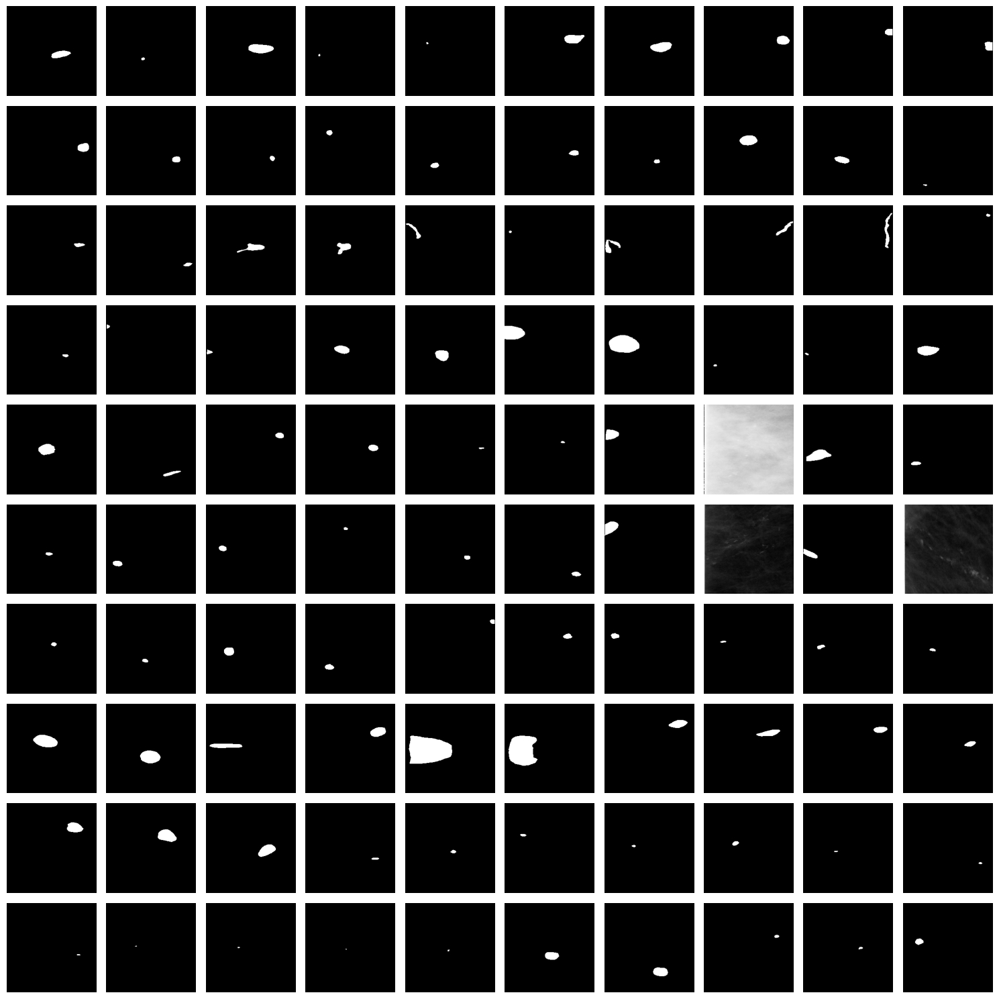

Displaying batch 4/4


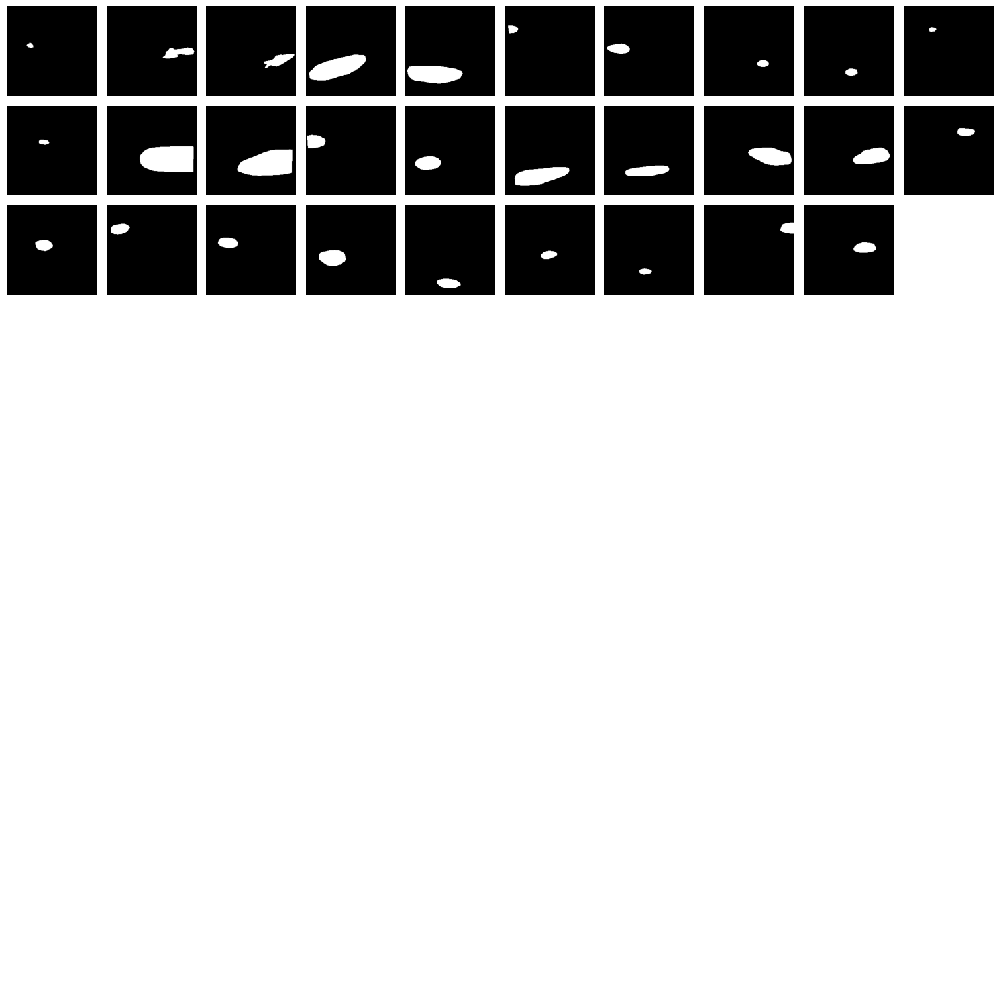

In [37]:

def plot_images_in_grid(images, titles=None, grid_size=(10, 10), figsize=(15, 15)):
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=figsize)
    axes = axes.flatten()
    
    for i in range(len(axes)):
        if i < len(images):
            axes[i].imshow(cv.resize(dcmread(images[i]).pixel_array, (224,224)), cmap='gray')
            if titles:
                axes[i].set_title(titles[i])
            axes[i].axis('off')
        else:
            axes[i].axis('off')  # Hide any unused axes

    plt.tight_layout()
    plt.show()

def display_images_in_batches(images, titles=None, batch_size=100, grid_size=(10, 10)):
    num_batches = len(images) // batch_size + (1 if len(images) % batch_size > 0 else 0)
    
    for batch_num in range(num_batches):
        batch_start = batch_num * batch_size
        batch_end = min(batch_start + batch_size, len(images))
        batch_images = images[batch_start:batch_end]
        batch_titles = titles[batch_start:batch_end] if titles else None
        
        print(f"Displaying batch {batch_num + 1}/{num_batches}")
        plot_images_in_grid(batch_images, titles=batch_titles, grid_size=grid_size)

# Example usage: Plot all images
display_images_in_batches(black_images_df['dicom_file'].tolist(), batch_size=100, grid_size=(10, 10))

Displaying batch 1/4


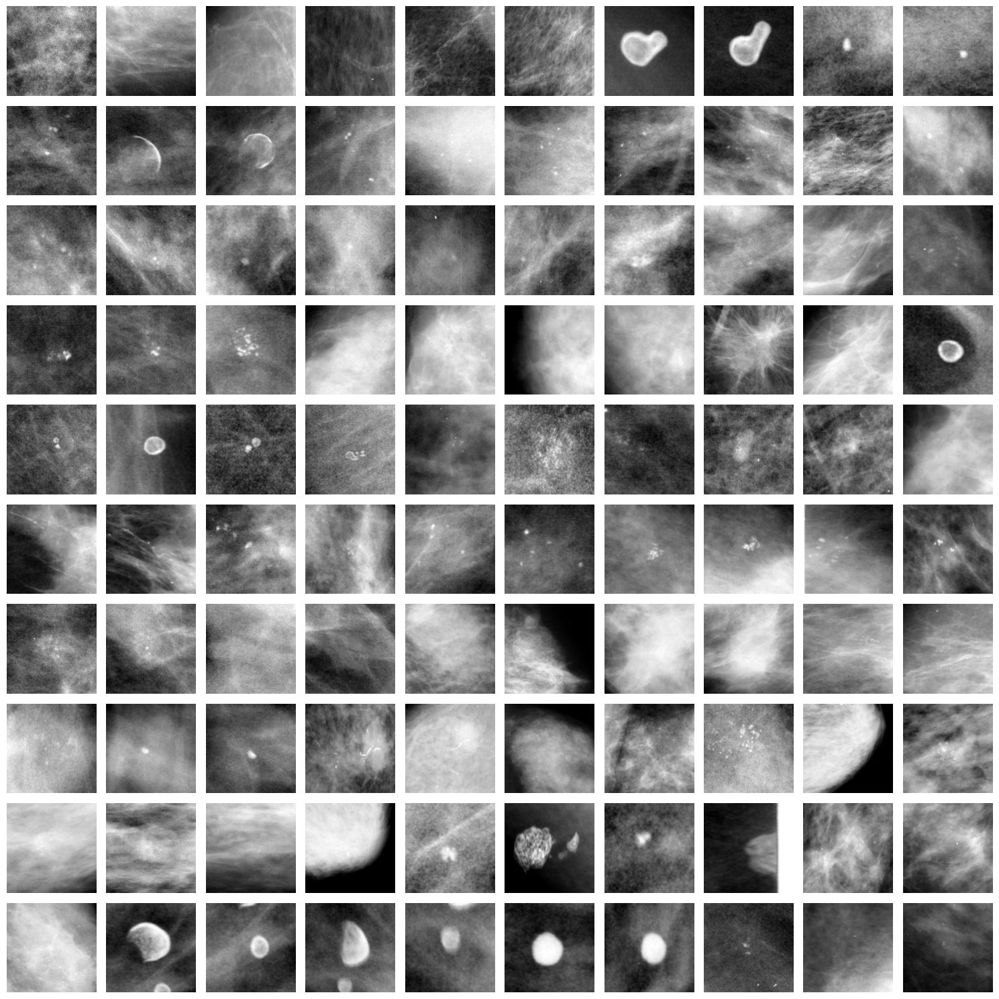

Displaying batch 2/4


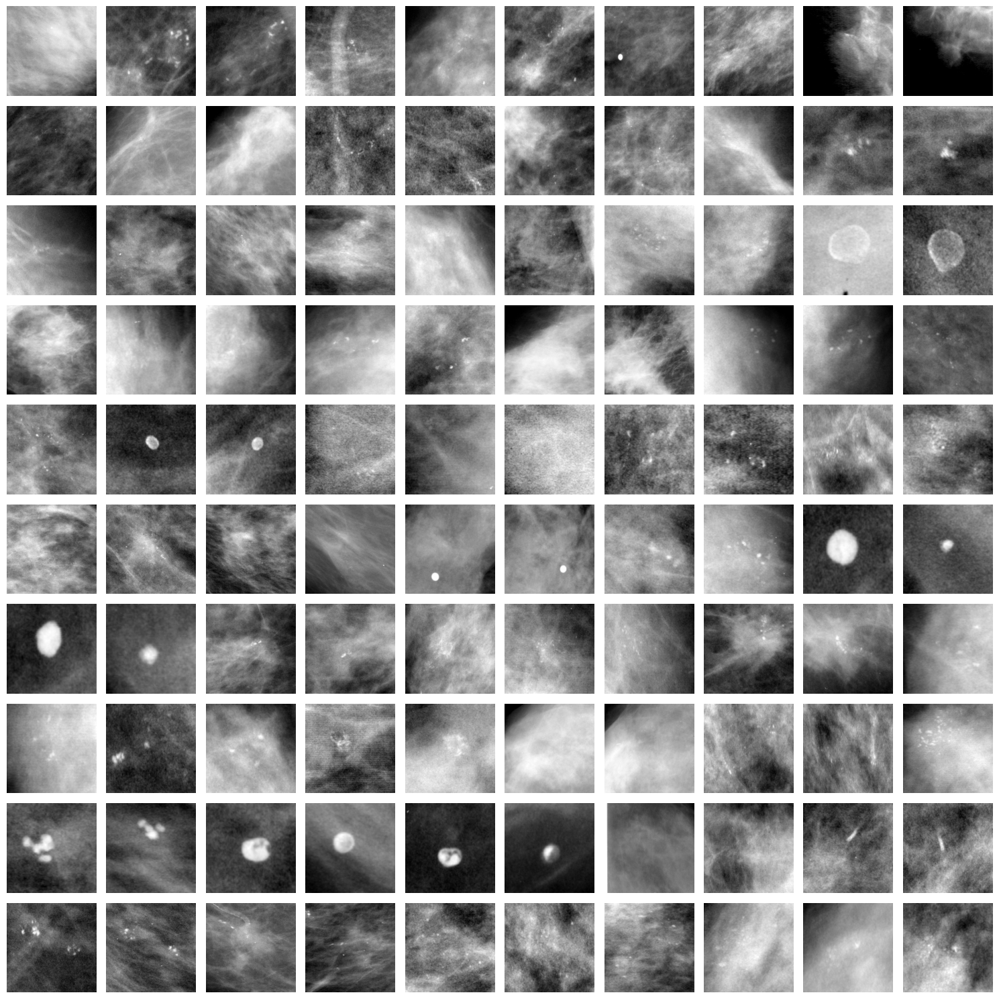

Displaying batch 3/4


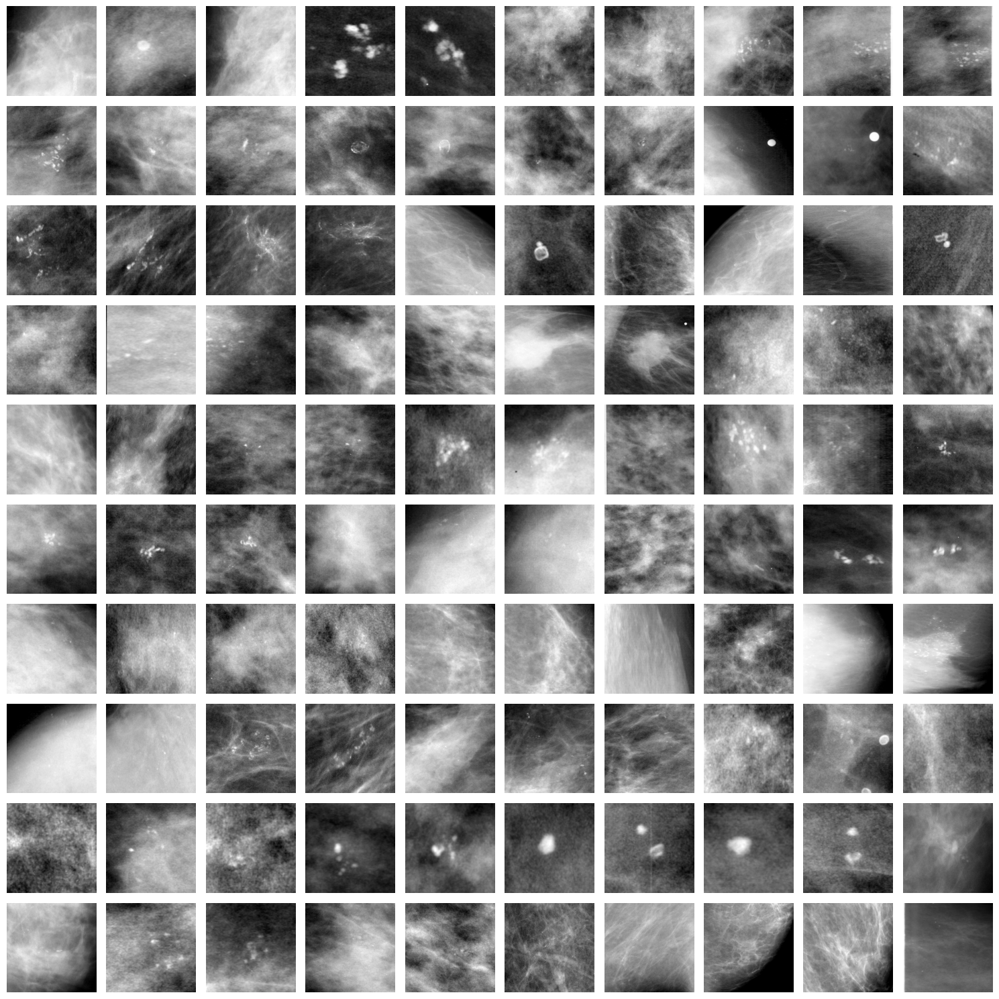

Displaying batch 4/4


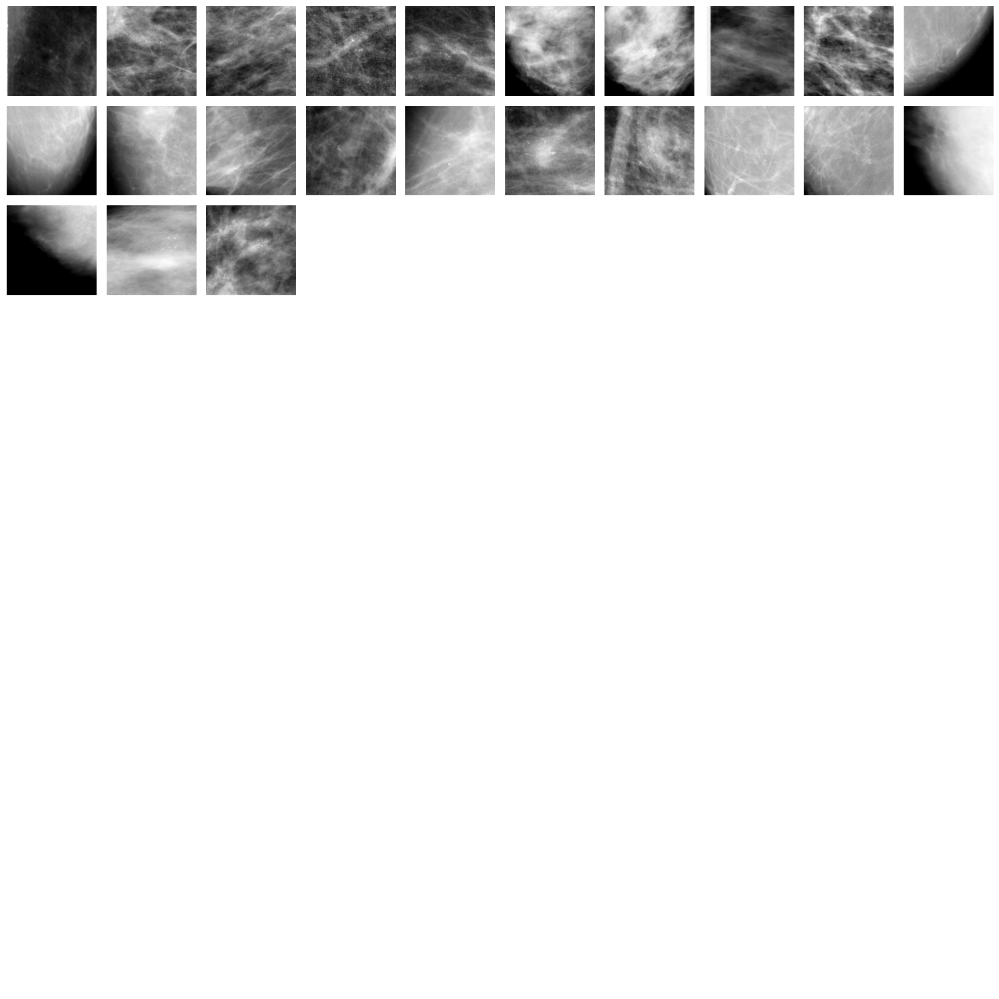

In [38]:
display_images_in_batches(non_black_images_df['dicom_file'].tolist(), batch_size=100, grid_size=(10, 10))

In [39]:
processed_calc_test_df = non_black_images_df.copy()

# Create a new column 'output_path' that contains the desired file path
for i in range(len(processed_calc_test_df)):
    processed_calc_test_df.loc[i, 'output_path'] = f'../data/processed/calc_test/{i}.dcm'

# Display the first few rows to verify
processed_calc_test_df.head()

,dicom_file,pathology,output_path
0,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_C...,BENIGN,../data/processed/calc_test/0.dcm
1,../data/raw/CBIS-DDSM/Calc-Test_P_00038_LEFT_M...,BENIGN,../data/processed/calc_test/1.dcm
2,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK,../data/processed/calc_test/2.dcm
3,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK,../data/processed/calc_test/3.dcm
4,../data/raw/CBIS-DDSM/Calc-Test_P_00038_RIGHT_...,BENIGN_WITHOUT_CALLBACK,../data/processed/calc_test/4.dcm


In [41]:
import os
import cv2 as cv
from pydicom import dcmread
from pydicom.pixel_data_handlers.util import apply_modality_lut
from tqdm import tqdm
from skimage import img_as_float
from skimage.restoration import denoise_nl_means, estimate_sigma

def img_pipeline(image):
    # NL Means Denoising 
    f_img = img_as_float(image)
    sigma_est = np.mean(estimate_sigma(f_img, channel_axis=None))
    
    patch_kw = dict(
        patch_size=5, patch_distance=6  # 5x5 patches and 13x13 search area
    )

    denoise_fast = denoise_nl_means(f_img, h=0.8 * sigma_est, fast_mode=True, **patch_kw)

    # Histogram Equalization
    u_denoise = np.uint8(denoise_fast * 255)
    clahe = cv.createCLAHE(clipLimit=2, tileGridSize=(8, 8))
    cl1 = clahe.apply(u_denoise)

    # Resize the image to 224x224
    resized = cv.resize(cl1, (224, 224), interpolation=cv.INTER_AREA)
    
    return resized

# Ensure the output directory exists
os.makedirs('../data/processed/calc_test', exist_ok=True)

# Process each DICOM file
for i in tqdm(range(len(processed_calc_test_df))):
    dicom_file = processed_calc_test_df['dicom_file'][i]
    ds = dcmread(dicom_file)
    
    # Apply modality LUT if necessary
    img = apply_modality_lut(ds.pixel_array, ds)
    
    # Process the image
    processed_img = img_pipeline(img)
    
    # Ensure the processed image is in the correct dtype
    processed_img = processed_img.astype(img.dtype)
    
    # Update the pixel array in the DICOM dataset
    ds.Rows, ds.Columns = processed_img.shape
    ds.PixelData = processed_img.tobytes()
    
    # Update any necessary metadata
    ds.BitsAllocated = processed_img.dtype.itemsize * 8  # Set correct bit depth
    
    output_path = processed_calc_test_df['output_path'][i]
    
    # Save the modified DICOM file
    ds.save_as(output_path)

100%|██████████| 323/323 [01:35<00:00,  3.37it/s]


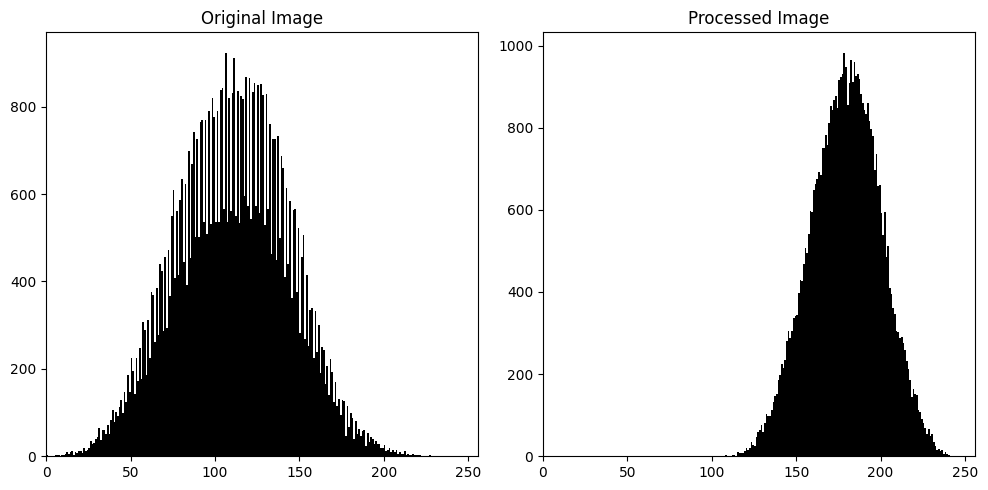

In [42]:
#plot the two histograms of an image before and after processing

img = dcmread(processed_calc_test_df['dicom_file'][0]).pixel_array

#normalize the image
img = cv.normalize(img, None, 0, 255, cv.NORM_MINMAX).astype(np.uint8)
processed_img = dcmread(processed_calc_test_df['output_path'][0]).pixel_array

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].hist(img.flatten(), bins=256, range=(0, 256), color='k')
axes[0].set_title('Original Image')
axes[0].set_xlim([0, 256])

axes[1].hist(processed_img.flatten(), bins=256, range=(0, 256), color='k')
axes[1].set_title('Processed Image')
axes[1].set_xlim([0, 256])

plt.tight_layout()
plt.show()



Displaying batch 1/4


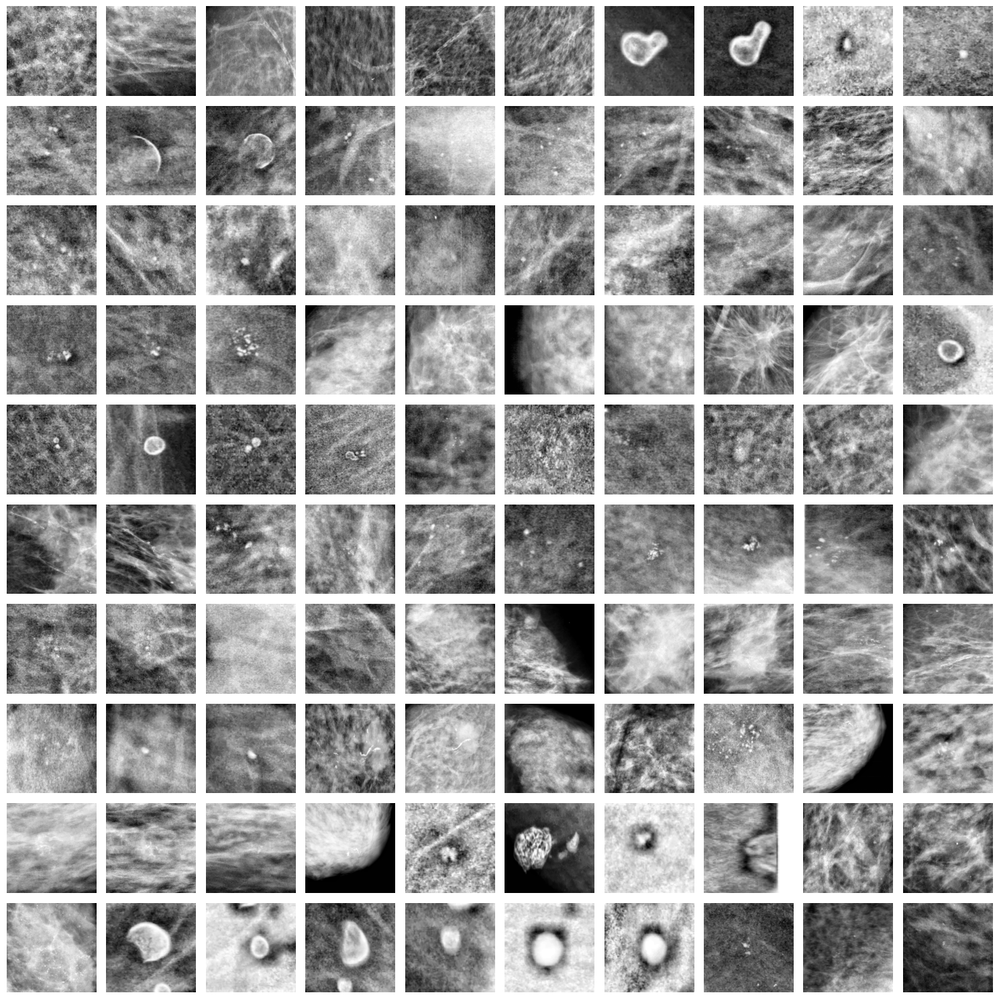

Displaying batch 2/4


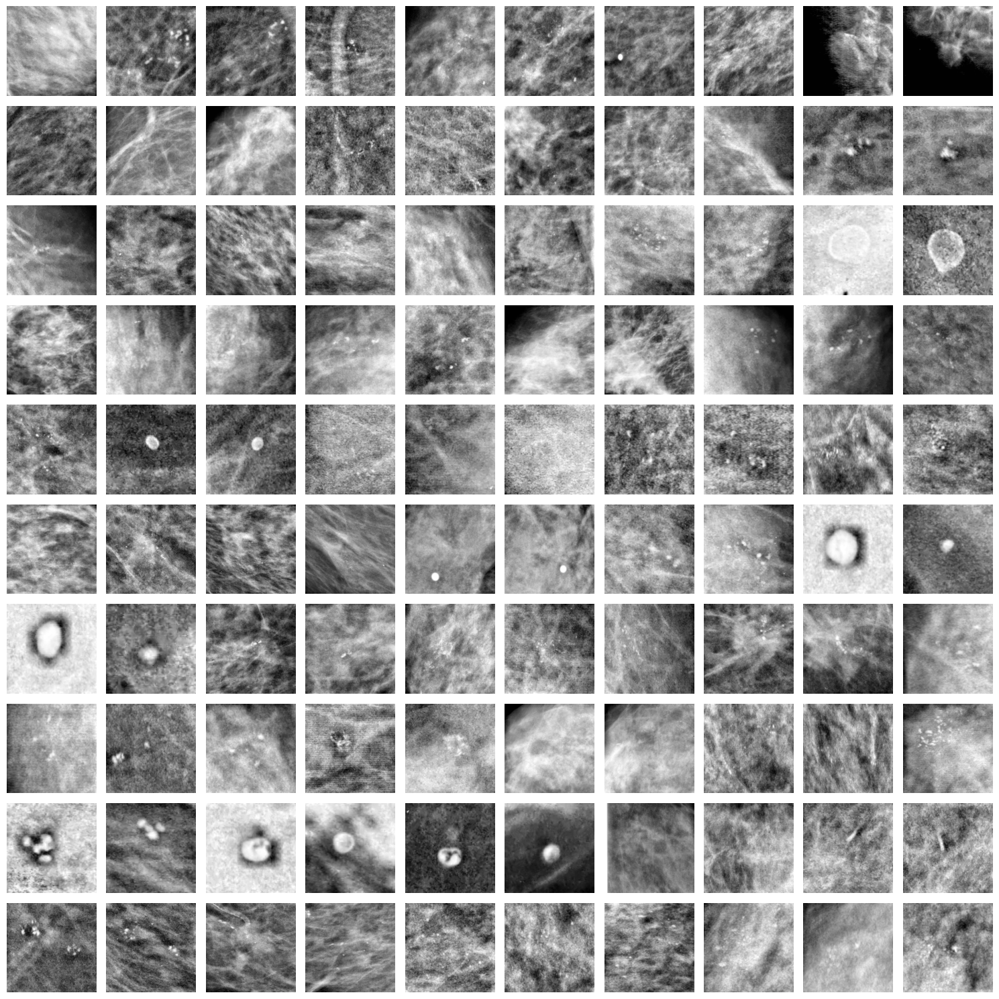

Displaying batch 3/4


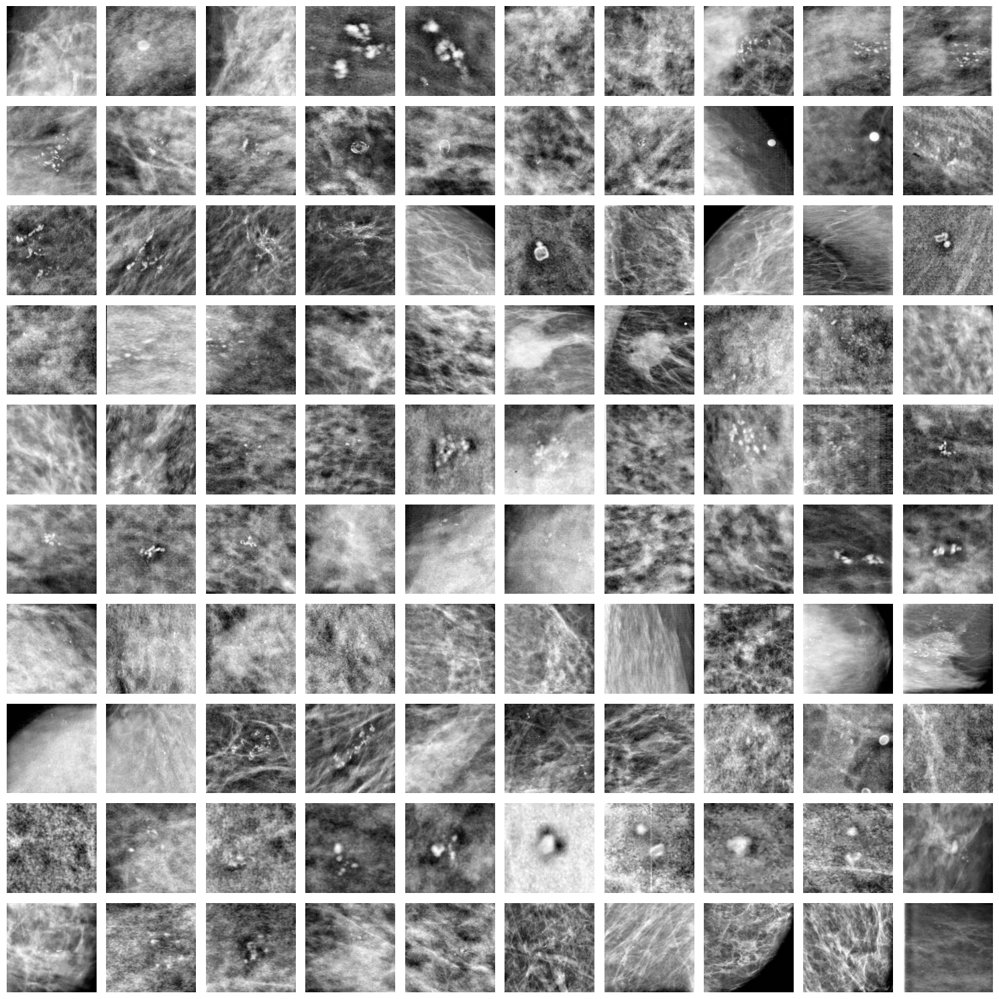

Displaying batch 4/4


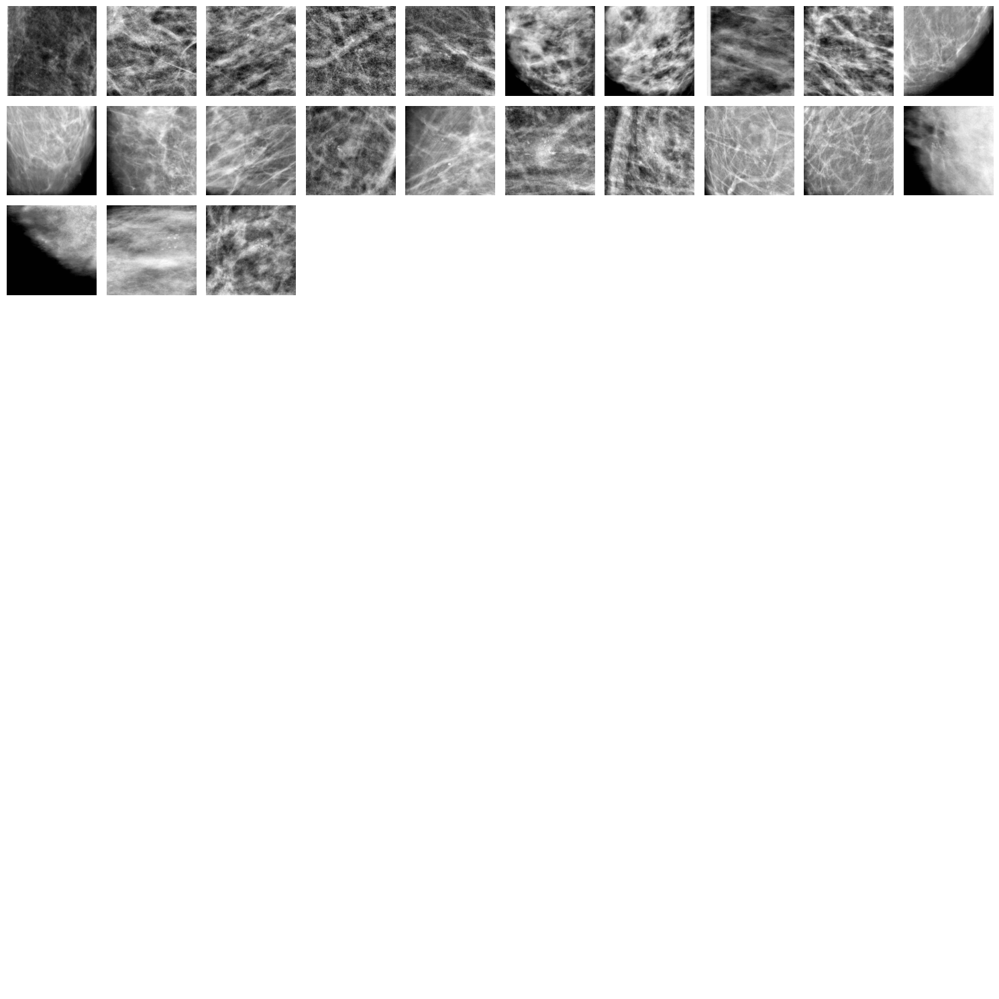

In [43]:
display_images_in_batches(processed_calc_test_df['output_path'].tolist(), batch_size=100, grid_size=(10, 10))

In [44]:
processed_calc_train_df = processed_calc_test_df.drop(columns=['dicom_file'])
processed_calc_train_df.head()


,pathology,output_path
0,BENIGN,../data/processed/calc_test/0.dcm
1,BENIGN,../data/processed/calc_test/1.dcm
2,BENIGN_WITHOUT_CALLBACK,../data/processed/calc_test/2.dcm
3,BENIGN_WITHOUT_CALLBACK,../data/processed/calc_test/3.dcm
4,BENIGN_WITHOUT_CALLBACK,../data/processed/calc_test/4.dcm


In [45]:
#save df to csv
processed_calc_train_df.to_csv('../data/processed/processed_calc_test.csv', index=False)